# Análise Comparativa de Extratores de Features Faciais

Neste jupyter notebook, podemos realizar a leitura dos arquivos que contém as features extraídas da face (landmarks) e compará-los a nível de quantidade de frames com landmarks detectados entre o tipo do extrator vs variação de data augmentation.


Os augmentation foram realizados a partir do script 'FacialActionLibras/src/data/augmentation.py'

## Extratores: 

- Dlib
- Mediapipe

## Augmentations:

- rot90
    - Parâmetros: k=1
- adjust_contrast
    - Parâmetros: contrast_factor=0.25
- adjust_hue
    - Parâmetros: delta=1.5
- stateless_random_brightness
    - Parâmetros: max_delta=0.95, seed=(0,0)
- adjust_jpeg_quality
    - Parâmetros: jpeg_quality==10
- adjust_brightness
    - Parâmetros: delta=0.5
- rgb_to_grayscale

## Referência:
https://www.tensorflow.org/api_docs/python/tf/image/


In [1]:
import os
import glob
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import mediapy as media
import cv2
import utils as u


## Load Data

In [2]:
def get_files(path, extrator, aug, extension):
    """
    Descrição: Recebe um path e lista todos os arquivos e seta o extrator + tipo de augmentation
    Retorna um dataframe com todos os files concatenados de um determinado path
    """
    all_filenames = []

    if(aug == 'original'):
        all_filenames = [i for i in glob.glob(path+'*.{}'.format(extension))]
    else:
        all_filenames = [i for i in glob.glob(path+aug+'/'+'*.{}'.format(extension))]
    
    df = pd.concat([pd.read_csv(f, sep=";", index_col=None) for f in all_filenames ])
    df['extractor'] = extrator
    df['aug'] = aug
    df['class'] = df['video_name'].str.split('_', expand=True)[1]
    
    return df[['frame', 'video_name', 'keys', 'extractor', 'aug', 'class']]



def join_files(paths, aug, extension='csv'):
    
    """
    Descrição: Recebe um dict dos paths de cada base submetida por cada extrator
    Retorna o dataframe combinado
    """
    
    df_combined = pd.DataFrame()
    
    if(aug=='original'):

        for key, value in paths.items():
            print(key, value)
            df = get_files(value, key, aug, extension)
            df_combined = pd.concat([df_combined, df], axis=0)
    
    elif(aug=='aug'):
        
        for key, value in paths.items():
            print(key, value)
            for aug in os.listdir(paths[key]):
                print(aug)
                df = get_files(value, key, aug, extension='csv')
                df_combined = pd.concat([df_combined, df], axis=0)
        
        
    return df_combined


In [3]:
#Original
inputs_orig = {
    'dlib': '../../data/processed/dlib/UCF-101-Analysis/',
    'mediapipe': '../../data/processed/mediapipe/UCF-101-Analysis/'
}

df_combined_orig = join_files(inputs_orig, aug='original', extension='csv')
df_combined_orig.shape

dlib ../../data/processed/dlib/UCF-101-Analysis/
mediapipe ../../data/processed/mediapipe/UCF-101-Analysis/


(268968, 6)

In [4]:
#Augmentation
inputs_aug = {
    'dlib': '../../data/processed/dlib/UCF-101-Analysis-augmentation/',
    'mediapipe': '../../data/processed/mediapipe/UCF-101-Analysis-augmentation/'
}

df_combined_aug = join_files(inputs_aug, aug='aug', extension='csv')
df_combined_aug.shape
        

dlib ../../data/processed/dlib/UCF-101-Analysis-augmentation/
rot90
adjust_contrast
adjust_hue
stateless_random_brightness
adjust_jpeg_quality
adjust_brightness
rgb_to_grayscale
mediapipe ../../data/processed/mediapipe/UCF-101-Analysis-augmentation/
rot90
adjust_contrast
adjust_hue
stateless_random_brightness
adjust_jpeg_quality
adjust_brightness
rgb_to_grayscale


(1882776, 6)

In [5]:
#Concat Augmentation and Original
        
df_combined = pd.concat([df_combined_orig, df_combined_aug], axis=0)
df_combined['na'] = np.where(df_combined['keys'].isna(), 1, 0)
df_combined.head(2)

,frame,video_name,keys,extractor,aug,class,na
0,1,v_BrushingTeeth_g21_c04.avi,"[[72, 26], [69, 47], [70, 69], [75, 92], [84, ...",dlib,original,BrushingTeeth,0
1,2,v_BrushingTeeth_g21_c04.avi,"[[85, 30], [82, 48], [83, 68], [87, 86], [91, ...",dlib,original,BrushingTeeth,0


In [6]:
df_combined['class'].unique()

array(['BrushingTeeth', 'ApplyEyeMakeup', 'ShavingBeard', 'PlayingFlute'],
      dtype=object)

In [7]:
print('Quantidade de Frames [Dlib]: '+str(df_combined.loc[df_combined.extractor == 'dlib'].shape))
print('Quantidade de Frames [Mediapipe]: '+str(df_combined.loc[df_combined.extractor == 'mediapipe'].shape))

Quantidade de Frames [Dlib]: (1075872, 7)
Quantidade de Frames [Mediapipe]: (1075872, 7)


# Por Augmentation

In [8]:
df_combined.groupby(['extractor', 'aug']).size().reset_index(name='counts')

,extractor,aug,counts
0,dlib,adjust_brightness,134484
1,dlib,adjust_contrast,134484
2,dlib,adjust_hue,134484
3,dlib,adjust_jpeg_quality,134484
4,dlib,original,134484
5,dlib,rgb_to_grayscale,134484
6,dlib,rot90,134484
7,dlib,stateless_random_brightness,134484
8,mediapipe,adjust_brightness,134484
9,mediapipe,adjust_contrast,134484


In [9]:
label_mediapipe = 'mediapipe'
label_dlib = 'dlib'

print("----- Description -----")
mdnna = (len(df_combined.loc[(df_combined.extractor == label_mediapipe) & (df_combined['keys'].notna())])/len(df_combined))
mdna = (len(df_combined.loc[(df_combined.extractor == label_mediapipe) & (df_combined['keys'].isna())])/len(df_combined))
dbnna = (len(df_combined.loc[(df_combined.extractor == label_dlib) & (df_combined['keys'].notna())])/len(df_combined))
dbna = (len(df_combined.loc[(df_combined.extractor == label_dlib) & (df_combined['keys'].isna())])/len(df_combined))


print("Porcentagem frames com landmarks detectados Mediapipe: {:.2f}%".format(mdnna))
print("Porcentagem frames com landmarks NÃO detectados Mediapipe: {:.2f}%".format(mdna))
print("Porcentagem frames com landmarks detectados Dlib: {:.2f}%".format(dbnna))
print("Porcentagem frames com landmarks NÃO detectados Dlib: {:.2f}%".format(dbna))
    

----- Description -----
Porcentagem frames com landmarks detectados Mediapipe: 0.30%
Porcentagem frames com landmarks NÃO detectados Mediapipe: 0.20%
Porcentagem frames com landmarks detectados Dlib: 0.11%
Porcentagem frames com landmarks NÃO detectados Dlib: 0.39%


In [10]:
def plt_bar_extract(df_combined, extractor):
    fig = plt.figure(figsize=(14,8))
    count = 1
    colors = ['green',"red"]

    df = df_combined.loc[(df_combined['extractor'] == extractor)]
    ax = sns.countplot(x="aug", hue="na", data=df, palette=colors)
    ax.set(ylabel='Total of Frames', title=extractor)
    for c in ax.containers:
        labels = [f'{w/len(df.index)*len(df.aug.unique())*100:0.1f}%' if (w := v.get_height()) > 0 else '' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    plt.xticks(rotation=20)



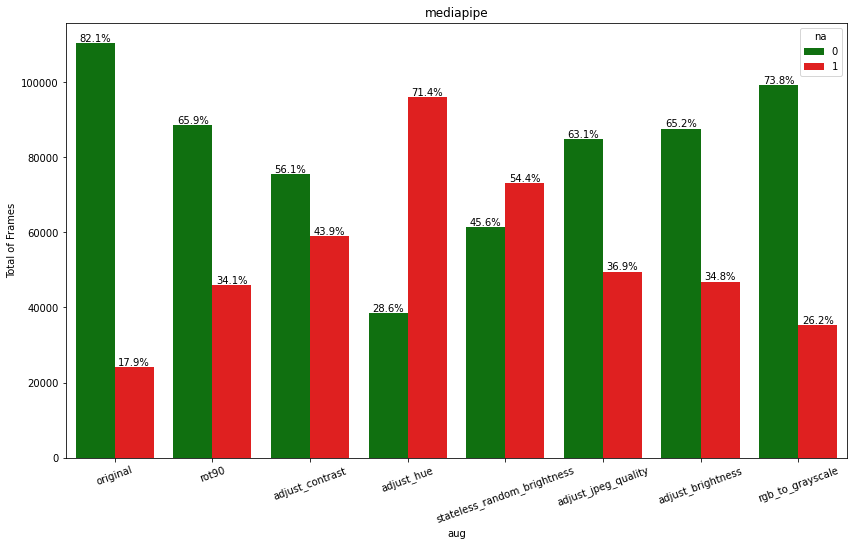

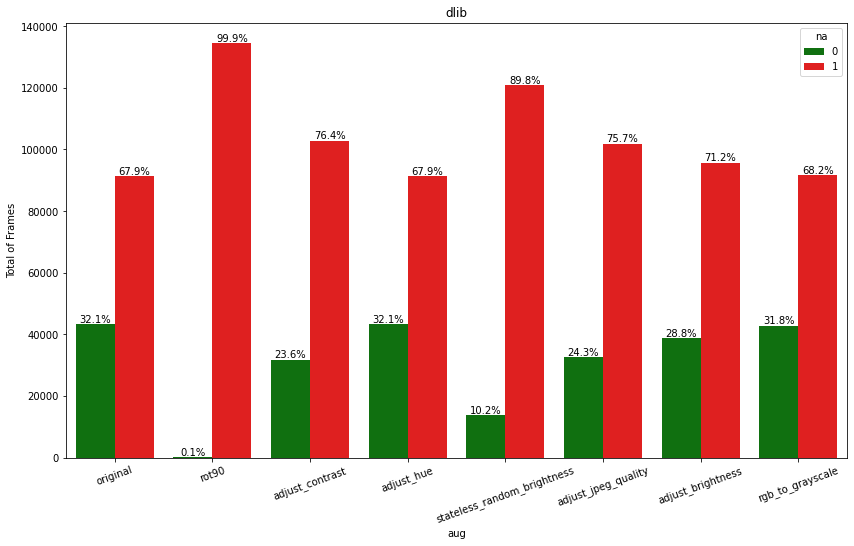

In [11]:
plt_bar_extract(df_combined,  'mediapipe')
plt_bar_extract(df_combined,  'dlib')

In [12]:
dados = df_combined.groupby(['extractor', 'aug', 'na']).size().reset_index(name='counts')


In [13]:
dados

,extractor,aug,na,counts
0,dlib,adjust_brightness,0,38788
1,dlib,adjust_brightness,1,95696
2,dlib,adjust_contrast,0,31729
3,dlib,adjust_contrast,1,102755
4,dlib,adjust_hue,0,43182
5,dlib,adjust_hue,1,91302
6,dlib,adjust_jpeg_quality,0,32630
7,dlib,adjust_jpeg_quality,1,101854
8,dlib,original,0,43212
9,dlib,original,1,91272


In [14]:
df_combined

,frame,video_name,keys,extractor,aug,class,na
0,1,v_BrushingTeeth_g21_c04.avi,"[[72, 26], [69, 47], [70, 69], [75, 92], [84, ...",dlib,original,BrushingTeeth,0
1,2,v_BrushingTeeth_g21_c04.avi,"[[85, 30], [82, 48], [83, 68], [87, 86], [91, ...",dlib,original,BrushingTeeth,0
2,3,v_BrushingTeeth_g21_c04.avi,"[[75, 31], [74, 50], [75, 71], [79, 91], [84, ...",dlib,original,BrushingTeeth,0
3,4,v_BrushingTeeth_g21_c04.avi,"[[76, 29], [74, 48], [75, 69], [78, 89], [84, ...",dlib,original,BrushingTeeth,0
4,5,v_BrushingTeeth_g21_c04.avi,"[[76, 28], [73, 47], [74, 68], [77, 87], [82, ...",dlib,original,BrushingTeeth,0
...,...,...,...,...,...,...,...
176,177,v_ApplyEyeMakeup_g20_c06.avi,"[[0.44502678513526917, 0.6097497940063477, -0....",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
177,178,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4459783732891083, 0.6087698340415955, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
178,179,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4468381106853485, 0.6081113219261169, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
179,180,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4518412947654724, 0.6079087257385254, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0


# Diferença do Augmentation para a base Original

In [15]:
def diff_calcule(df_combined):
    
    df_diff_ofc = pd.DataFrame()
    
    for i in df_combined['extractor'].unique():
        df = df_combined.loc[(df_combined['extractor'] == i)]
        df_diff = pd.crosstab(df['aug'],df['na']).apply(lambda r: r/r.sum(), axis=1).reset_index()

        ## Diferença de porcentagem
        ref_origin =  df_diff.loc[df_diff.aug == 'original'].reset_index().at[0,0] #index, col
        print(ref_origin)

        df_diff['diff_original'] = df_diff[0] - ref_origin
        df_diff['extractor'] = i
        df_diff.rename(columns={0:'notna'}, inplace=True)
        del df_diff[1]
        
        df_diff_ofc = pd.concat([df_diff_ofc, df_diff], axis=0)
    
    return df_diff_ofc

In [16]:
df_diff = diff_calcule(df_combined)
df_diff

0.32131703399660927
0.8209675500431278


na,aug,notna,diff_original,extractor
0,adjust_brightness,0.288421,-0.032896,dlib
1,adjust_contrast,0.235931,-0.085386,dlib
2,adjust_hue,0.321094,-0.000223,dlib
3,adjust_jpeg_quality,0.242631,-0.078686,dlib
4,original,0.321317,0.000000,dlib
5,rgb_to_grayscale,0.318313,-0.003004,dlib
6,rot90,0.000587,-0.320730,dlib
7,stateless_random_brightness,0.101834,-0.219483,dlib
0,adjust_brightness,0.651594,-0.169373,mediapipe
1,adjust_contrast,0.561435,-0.259533,mediapipe


In [17]:
df_diff.reset_index().copy()

na,index,aug,notna,diff_original,extractor
0,0,adjust_brightness,0.288421,-0.032896,dlib
1,1,adjust_contrast,0.235931,-0.085386,dlib
2,2,adjust_hue,0.321094,-0.000223,dlib
3,3,adjust_jpeg_quality,0.242631,-0.078686,dlib
4,4,original,0.321317,0.000000,dlib
5,5,rgb_to_grayscale,0.318313,-0.003004,dlib
6,6,rot90,0.000587,-0.320730,dlib
7,7,stateless_random_brightness,0.101834,-0.219483,dlib
8,0,adjust_brightness,0.651594,-0.169373,mediapipe
9,1,adjust_contrast,0.561435,-0.259533,mediapipe


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'adjust_brightness'),
  Text(1, 0, 'adjust_contrast'),
  Text(2, 0, 'adjust_hue'),
  Text(3, 0, 'adjust_jpeg_quality'),
  Text(4, 0, 'original'),
  Text(5, 0, 'rgb_to_grayscale'),
  Text(6, 0, 'rot90'),
  Text(7, 0, 'stateless_random_brightness')])

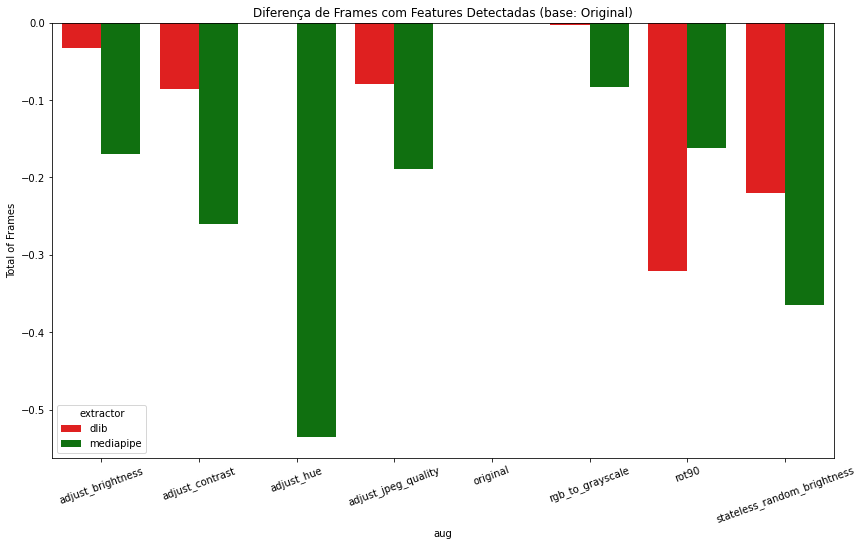

In [18]:
fig = plt.figure(figsize=(14,8))
count = 1
colors = ["red", 'green']
ax = sns.barplot(x="aug", y="diff_original", hue="extractor", data=df_diff, palette=colors)
ax.set(ylabel='Total of Frames', title='Diferença de Frames com Features Detectadas (base: Original)')
plt.xticks(rotation=20)

## Análise dos Gráficos

Ao considerar a diferença de quantidade de frames com landmarks detectados entre a base original e as variações de data augmentation, é possível perceber que o extrator Mediapipe é mais sensível ao ajuste de hue (matiz/tonalidade), redução de brilho e ajuste de contraste. 

Já o Dlib é muito sensível quando os dados estão rotacionados a 90° e podemos considerar que, ao observar os dados analisados, o Dlib não é sensível a dados em escala de cinza e muito pouco sensível a dados com ajuste de hue (matiz/tonalidade).



In [19]:
def get_total_frames_unit(video, ext, aug, total_frames):
    return total_frames.loc[(total_frames.video_name == video) & 
                            (total_frames.extractor == ext) & 
                            (total_frames.aug == aug)].reset_index().at[0,'total_frames'] #index, col

In [20]:
df_combined

,frame,video_name,keys,extractor,aug,class,na
0,1,v_BrushingTeeth_g21_c04.avi,"[[72, 26], [69, 47], [70, 69], [75, 92], [84, ...",dlib,original,BrushingTeeth,0
1,2,v_BrushingTeeth_g21_c04.avi,"[[85, 30], [82, 48], [83, 68], [87, 86], [91, ...",dlib,original,BrushingTeeth,0
2,3,v_BrushingTeeth_g21_c04.avi,"[[75, 31], [74, 50], [75, 71], [79, 91], [84, ...",dlib,original,BrushingTeeth,0
3,4,v_BrushingTeeth_g21_c04.avi,"[[76, 29], [74, 48], [75, 69], [78, 89], [84, ...",dlib,original,BrushingTeeth,0
4,5,v_BrushingTeeth_g21_c04.avi,"[[76, 28], [73, 47], [74, 68], [77, 87], [82, ...",dlib,original,BrushingTeeth,0
...,...,...,...,...,...,...,...
176,177,v_ApplyEyeMakeup_g20_c06.avi,"[[0.44502678513526917, 0.6097497940063477, -0....",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
177,178,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4459783732891083, 0.6087698340415955, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
178,179,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4468381106853485, 0.6081113219261169, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0
179,180,v_ApplyEyeMakeup_g20_c06.avi,"[[0.4518412947654724, 0.6079087257385254, -0.0...",mediapipe,rgb_to_grayscale,ApplyEyeMakeup,0


In [21]:
total_frames = df_combined.groupby(['video_name', 'extractor', 'aug', 'class']).size().reset_index(name='total_frames')

df_diff_unit = df_combined.groupby(['video_name', 'extractor', 'aug', 'class', 'na']).size().reset_index(name='counts_notna')
df_diff_unit = df_diff_unit.loc[df_diff_unit.na == 0].reset_index()
df_diff_unit['total_frames'] = df_diff_unit.apply(lambda x: get_total_frames_unit(x['video_name'], x['extractor'], x['aug'], total_frames), axis=1)
df_diff_unit['percent_notna'] = df_diff_unit['counts_notna']/df_diff_unit['total_frames']*100
df_diff_unit.loc[df_diff_unit.video_name == 'v_ApplyEyeMakeup_g01_c01.avi']

,index,video_name,extractor,aug,class,na,counts_notna,total_frames,percent_notna
0,0,v_ApplyEyeMakeup_g01_c01.avi,dlib,adjust_brightness,ApplyEyeMakeup,0,46,164,28.048780
1,2,v_ApplyEyeMakeup_g01_c01.avi,dlib,adjust_contrast,ApplyEyeMakeup,0,44,164,26.829268
2,4,v_ApplyEyeMakeup_g01_c01.avi,dlib,adjust_hue,ApplyEyeMakeup,0,55,164,33.536585
3,6,v_ApplyEyeMakeup_g01_c01.avi,dlib,adjust_jpeg_quality,ApplyEyeMakeup,0,41,164,25.000000
4,8,v_ApplyEyeMakeup_g01_c01.avi,dlib,original,ApplyEyeMakeup,0,54,164,32.926829
5,10,v_ApplyEyeMakeup_g01_c01.avi,dlib,rgb_to_grayscale,ApplyEyeMakeup,0,55,164,33.536585
6,13,v_ApplyEyeMakeup_g01_c01.avi,dlib,stateless_random_brightness,ApplyEyeMakeup,0,25,164,15.243902
7,15,v_ApplyEyeMakeup_g01_c01.avi,mediapipe,adjust_brightness,ApplyEyeMakeup,0,104,164,63.414634
8,17,v_ApplyEyeMakeup_g01_c01.avi,mediapipe,adjust_contrast,ApplyEyeMakeup,0,127,164,77.439024
9,19,v_ApplyEyeMakeup_g01_c01.avi,mediapipe,adjust_hue,ApplyEyeMakeup,0,55,164,33.536585


In [22]:
df_diff_unit['percent_notna'].min()

0.13089005235602094

In [23]:
df_diff_unit['percent_notna'].max()

100.0

<Figure size 1008x576 with 0 Axes>

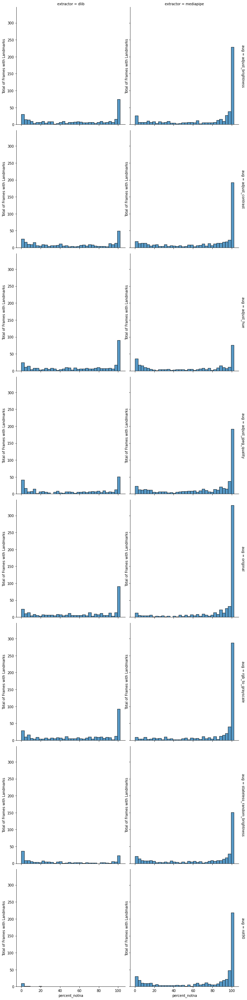

In [24]:
fig = plt.figure(figsize=(14,8))

ax =  sns.displot(
    df_diff_unit, x="percent_notna", col="extractor", row="aug",
    binwidth=3, height=5, facet_kws=dict(margin_titles=True),
)
ax.set(ylabel='Total of Frames with Landmarks')


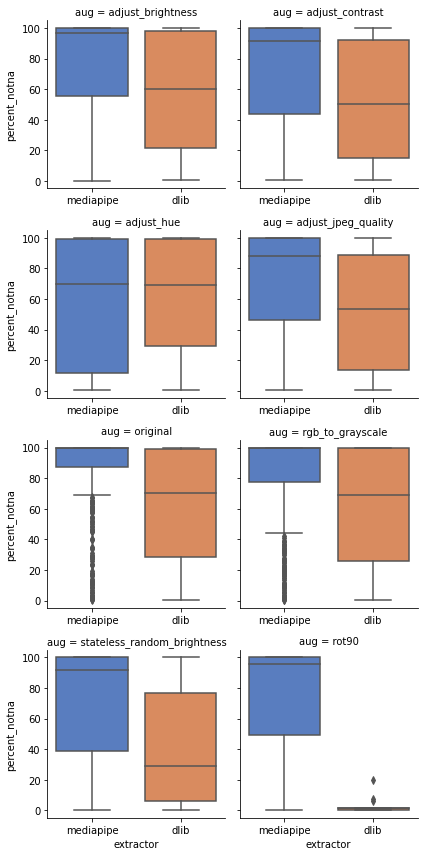

In [25]:
g = sns.FacetGrid(df_diff_unit, col='aug',col_wrap=2)
#                                               change this to 4 ^
g.map(sns.boxplot,'extractor','percent_notna',palette='muted', order=['mediapipe', 'dlib'])
for ax in g.axes.flatten(): 
    ax.tick_params(labelbottom=True)
plt.tight_layout()
plt.show()

In [26]:
#Ao analisar a figura acima, temos que para o dataset original quando submetido ao extrator Dlib, há uma concentração de outliers considerável abaixo 70%, ou seja, de vídeos em que a porcentagem da quantidade de seus frames com landmarks detectados foi menor que 70%.

#Embora o Mediapipe tenha uma quantidade de frames detectados muito maior que o Dlib. Ao avaliar por vídeo (a unidade) e realizar um processamento de forma que para cada linha (vídeo) para encontrar a porcentagem de frames detectados nesse mesmo vídeo. Podemos ver que no Dlib, há um número considerável de outliers abaixo de 70%, isto é, há um número considerável de vídeos específicos em que o total de seus frames com landmarks detectados são abaixo de 70%.

#Resumindo, mas não concluindo. Talvez se não existissem "alguns vídeos específicos" o Dlib pode melhorar bastante a detecção de landmarks. Hipótese: Talvez "esses vídeos específicos" que tem 70% do seu corpo sem landmarks detectados, seja pelo fato de terem alguma característica em comum que deixa o Dlib sensível (como a distância da câmera ou tamanho do crop da face).

#Então vamos analisar alguns desses outliers?

#Validado (motivos):

#Ordem
#<=0.70 [0:100]
#whis=np.inf,


#16% dos dados podem ser considerados outliers...
#Qual o valor default para delimitar o que é um outlier ou não

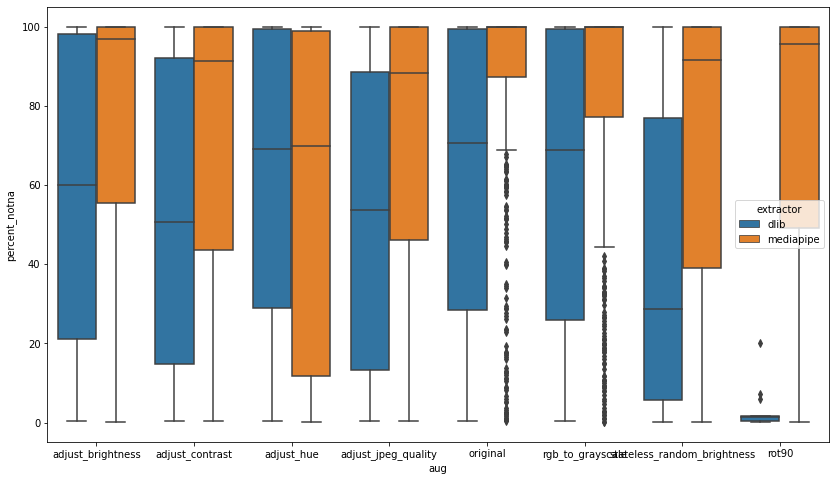

In [27]:
fig = plt.figure(figsize=(14,8))

ax = sns.boxplot(x="aug", y="percent_notna", data=df_diff_unit, hue="extractor")
#ax = sns.stripplot(x="aug", y="percent_notna", data=df_diff_unit, color=".3", hue="extractor")

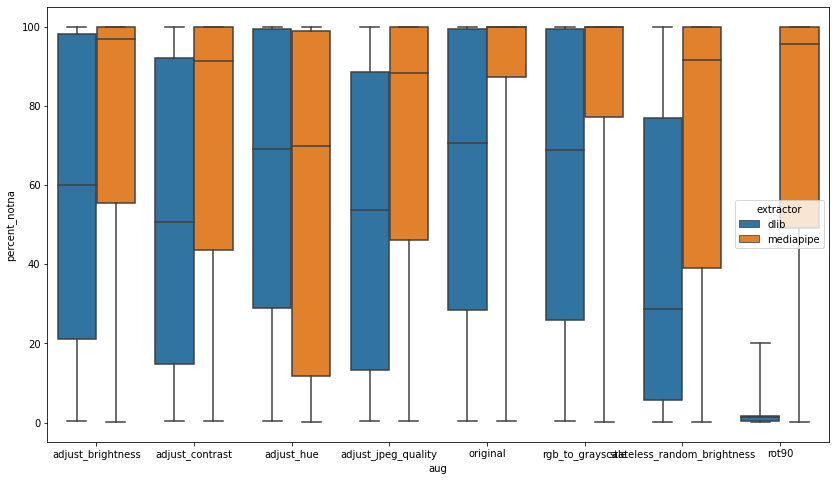

In [28]:
fig = plt.figure(figsize=(14,8))

ax = sns.boxplot(x="aug", y="percent_notna", data=df_diff_unit, whis=np.inf, hue="extractor")
#ax = sns.stripplot(x="aug", y="percent_notna", data=df_diff_unit, color=".3", hue="extractor")

In [29]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 #(df_diff_unit.extractor == 'mediapipe') & 
                 (df_diff_unit.percent_notna <= 0.70)].shape

(5, 9)

In [30]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'mediapipe')].percent_notna.median()

100.0

In [31]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'dlib')].percent_notna.median()

70.53941908713693

In [32]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'mediapipe')].percent_notna.quantile(.05)

13.10344827586207

In [33]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'dlib')].percent_notna.quantile(.05)

1.8957345971563981

In [34]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & (df_diff_unit.extractor == 'mediapipe') & (df_diff_unit.percent_notna < 70)]

,index,video_name,extractor,aug,class,na,counts_notna,total_frames,percent_notna
136,222,v_ApplyEyeMakeup_g02_c04.avi,mediapipe,original,ApplyEyeMakeup,0,15,170,8.823529
259,448,v_ApplyEyeMakeup_g04_c03.avi,mediapipe,original,ApplyEyeMakeup,0,1,114,0.877193
1607,2785,v_ApplyEyeMakeup_g22_c01.avi,mediapipe,original,ApplyEyeMakeup,0,46,170,27.058824
1616,2810,v_ApplyEyeMakeup_g22_c02.avi,mediapipe,original,ApplyEyeMakeup,0,138,257,53.696498
1640,2866,v_ApplyEyeMakeup_g22_c04.avi,mediapipe,original,ApplyEyeMakeup,0,121,208,58.173077
...,...,...,...,...,...,...,...,...,...
5869,13104,v_ShavingBeard_g22_c07.avi,mediapipe,original,ShavingBeard,0,118,202,58.415842
6054,13468,v_ShavingBeard_g25_c01.avi,mediapipe,original,ShavingBeard,0,22,210,10.476190
6068,13498,v_ShavingBeard_g25_c02.avi,mediapipe,original,ShavingBeard,0,116,226,51.327434
6073,13519,v_ShavingBeard_g25_c03.avi,mediapipe,original,ShavingBeard,0,5,230,2.173913


In [35]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & (df_diff_unit.extractor == 'mediapipe')].shape

(561, 9)

In [36]:
ff = df_diff_unit.loc[(df_diff_unit.aug == 'original')]

ff

,index,video_name,extractor,aug,class,na,counts_notna,total_frames,percent_notna
4,8,v_ApplyEyeMakeup_g01_c01.avi,dlib,original,ApplyEyeMakeup,0,54,164,32.926829
11,23,v_ApplyEyeMakeup_g01_c01.avi,mediapipe,original,ApplyEyeMakeup,0,151,164,92.073171
19,39,v_ApplyEyeMakeup_g01_c02.avi,dlib,original,ApplyEyeMakeup,0,87,123,70.731707
26,52,v_ApplyEyeMakeup_g01_c02.avi,mediapipe,original,ApplyEyeMakeup,0,123,123,100.000000
34,64,v_ApplyEyeMakeup_g01_c03.avi,dlib,original,ApplyEyeMakeup,0,146,259,56.370656
...,...,...,...,...,...,...,...,...,...
6054,13468,v_ShavingBeard_g25_c01.avi,mediapipe,original,ShavingBeard,0,22,210,10.476190
6061,13483,v_ShavingBeard_g25_c02.avi,dlib,original,ShavingBeard,0,16,226,7.079646
6068,13498,v_ShavingBeard_g25_c02.avi,mediapipe,original,ShavingBeard,0,116,226,51.327434
6073,13519,v_ShavingBeard_g25_c03.avi,mediapipe,original,ShavingBeard,0,5,230,2.173913


In [37]:
path_visual = './../../data/raw/UCF-101-Analysis/ApplyEyeMakeup/'
l_videos = sorted(os.listdir(path_visual))

video1 = media.read_video(path_visual+str(l_videos[0]))
video2 = media.read_video(path_visual+str(l_videos[1]))
video3 = media.read_video(path_visual+str(l_videos[2]))
video4 = media.read_video(path_visual+str(l_videos[3]))
video5 = media.read_video(path_visual+str(l_videos[4]))
video6 = media.read_video(path_visual+str(l_videos[5]))
video7 = media.read_video(path_visual+str(l_videos[6]))
video8 = media.read_video(path_visual+str(l_videos[7]))
video9 = media.read_video(path_visual+str(l_videos[8]))
video10 = media.read_video(path_visual+str(l_videos[9]))

# Show multiple videos side-by-side.
s = 90
vis_videos = {
    'v_ApplyEyeMakeup_g01_c02-DLIB': video1,
    'v_ApplyEyeMakeup_g01_c02-MEDIAPIPE': video2,
    'v_PlayingFlute_g02_c06-DLIB': video3,
    'v_PlayingFlute_g02_c06-MEDIAPIPE': video4,
    'v_PlayingFlute_g03_c07-DLIB': video5,
    'v_PlayingFlute_g03_c07-MEDIAPIPE': video6,
    'v_ShavingBeard_g03_c03-DLIB': video7,
    'v_ShavingBeard_g03_c03-MEDIAPIPE': video8,
    'v_ShavingBeard_g04_c02-DLIB': video9,
    'v_ShavingBeard_g04_c02-MEDIAPIPE': video10,
    
}
media.show_videos(vis_videos, fps=25, columns=2)

# Por classe

/home/jms2/anaconda3/envs/2way/lib/python3.9/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


<Figure size 1008x576 with 0 Axes>

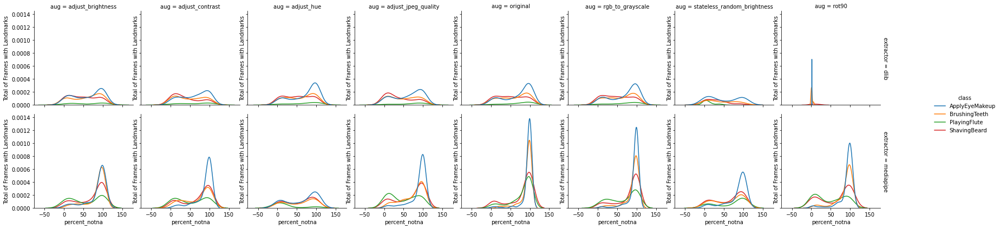

In [38]:
fig = plt.figure(figsize=(14,8))

ax =  sns.displot(
    df_diff_unit, x="percent_notna", row="extractor", col="aug", hue='class',
     height=3, facet_kws=dict(margin_titles=True), kind="kde", 
)
ax.set(ylabel='Total of Frames with Landmarks')

De maneira geral, analisando as figuras acima, podemos perceber que na maior parte dos casos, ambos os extratores, tiveram uma taxa maior de detecção em frames da classe ApplyEyeMakeup, enquanto que para as classes PlayingFlute e ShavingBeard, ambos os extratores apresentaram as menores taxas de detecção.

In [39]:
def get_total_frames_class(ext, aug, total_frames):
    return total_frames.loc[(total_frames.extractor == ext) & 
                            (total_frames.aug == aug)].reset_index().at[0,'total_frames'] #index, col

In [40]:
total_frames = df_combined.groupby(['extractor', 'aug', 'class']).size().reset_index(name='total_frames')

df_diff_class = df_combined.groupby(['extractor', 'aug', 'class', 'na']).size().reset_index(name='counts_notna')
df_diff_class = df_diff_class.loc[df_diff_class.na == 0].reset_index()
df_diff_class['total_frames'] = df_diff_class.apply(lambda x: get_total_frames_class( x['extractor'], x['aug'], total_frames), axis=1)
df_diff_class['percent_notna'] = df_diff_class['counts_notna']/df_diff_class['total_frames']*100
df_diff_class#.loc[df_diff_unit['class'] == 'v_ApplyEyeMakeup_g01_c01.avi']

,index,extractor,aug,class,na,counts_notna,total_frames,percent_notna
0,0,dlib,adjust_brightness,ApplyEyeMakeup,0,12489,24358,51.272682
1,2,dlib,adjust_brightness,BrushingTeeth,0,13131,24358,53.908367
2,4,dlib,adjust_brightness,PlayingFlute,0,3802,24358,15.608835
3,6,dlib,adjust_brightness,ShavingBeard,0,9366,24358,38.451433
4,8,dlib,adjust_contrast,ApplyEyeMakeup,0,11615,24358,47.684539
...,...,...,...,...,...,...,...,...
59,118,mediapipe,rot90,ShavingBeard,0,20963,24358,86.062074
60,120,mediapipe,stateless_random_brightness,ApplyEyeMakeup,0,17907,24358,73.515888
61,122,mediapipe,stateless_random_brightness,BrushingTeeth,0,14735,24358,60.493472
62,124,mediapipe,stateless_random_brightness,PlayingFlute,0,12534,24358,51.457427


<Figure size 1008x576 with 0 Axes>

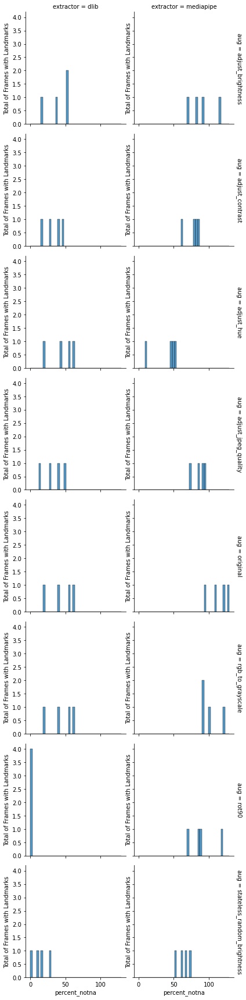

In [41]:
fig = plt.figure(figsize=(14,8))

ax =  sns.displot(
    df_diff_class, x="percent_notna", col="extractor", row="aug",
    binwidth=3, height=3, facet_kws=dict(margin_titles=True),
)
ax.set(ylabel='Total of Frames with Landmarks')


# Outilers

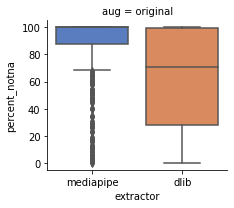

In [42]:
g = sns.FacetGrid(ff, col='aug',col_wrap=2)
#                                               change this to 4 ^
g.map(sns.boxplot,'extractor','percent_notna',palette='muted', order=['mediapipe', 'dlib'])
for ax in g.axes.flatten(): 
    ax.tick_params(labelbottom=True)
plt.tight_layout()
plt.show()

In [43]:
df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'mediapipe')].percent_notna.describe()

count    561.000000
mean      86.230702
std       26.252987
min        0.359712
25%       87.401575
50%      100.000000
75%      100.000000
max      100.000000
Name: percent_notna, dtype: float64

In [44]:
#https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-pandas-data-frame
from scipy import stats
df = df_diff_unit.loc[(df_diff_unit.aug == 'original') & 
                 (df_diff_unit.extractor == 'mediapipe')]
df[(np.abs(stats.zscore(df['percent_notna'])) > 3)].sort_values(by = 'counts_notna')

,index,video_name,extractor,aug,class,na,counts_notna,total_frames,percent_notna
259,448,v_ApplyEyeMakeup_g04_c03.avi,mediapipe,original,ApplyEyeMakeup,0,1,114,0.877193
3775,7762,v_PlayingFlute_g09_c02.avi,mediapipe,original,PlayingFlute,0,1,278,0.359712
4205,9137,v_PlayingFlute_g20_c03.avi,mediapipe,original,PlayingFlute,0,1,100,1.000000
5407,11979,v_ShavingBeard_g16_c03.avi,mediapipe,original,ShavingBeard,0,2,227,0.881057
5578,12403,v_ShavingBeard_g18_c07.avi,mediapipe,original,ShavingBeard,0,3,311,0.964630
3758,7681,v_PlayingFlute_g08_c05.avi,mediapipe,original,PlayingFlute,0,3,390,0.769231
5413,12017,v_ShavingBeard_g16_c05.avi,mediapipe,original,ShavingBeard,0,3,240,1.250000
3519,6749,v_PlayingFlute_g02_c02.avi,mediapipe,original,PlayingFlute,0,4,246,1.626016
3644,7311,v_PlayingFlute_g06_c02.avi,mediapipe,original,PlayingFlute,0,5,218,2.293578
6073,13519,v_ShavingBeard_g25_c03.avi,mediapipe,original,ShavingBeard,0,5,230,2.173913


In [45]:
df['path'] = df[['class', 'video_name']].agg('/'.join, axis=1)
l_videos = df.sample(n=10, random_state=1).reset_index()['path']
df.sample(n=10, random_state=1).reset_index()[['video_name', 'percent_notna']].sort_values(by='percent_notna')

/home/jms2/anaconda3/envs/2way/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


,video_name,percent_notna
1,v_ShavingBeard_g06_c07.avi,61.354582
3,v_ShavingBeard_g20_c02.avi,73.170732
9,v_ShavingBeard_g21_c04.avi,92.528736
8,v_ApplyEyeMakeup_g15_c03.avi,97.844828
0,v_ApplyEyeMakeup_g08_c04.avi,100.000000
2,v_BrushingTeeth_g17_c01.avi,100.000000
4,v_ShavingBeard_g05_c02.avi,100.000000
5,v_PlayingFlute_g16_c01.avi,100.000000
6,v_BrushingTeeth_g19_c03.avi,100.000000
7,v_BrushingTeeth_g06_c03.avi,100.000000


In [46]:
l_videos

0    ApplyEyeMakeup/v_ApplyEyeMakeup_g08_c04.avi
1        ShavingBeard/v_ShavingBeard_g06_c07.avi
2      BrushingTeeth/v_BrushingTeeth_g17_c01.avi
3        ShavingBeard/v_ShavingBeard_g20_c02.avi
4        ShavingBeard/v_ShavingBeard_g05_c02.avi
5        PlayingFlute/v_PlayingFlute_g16_c01.avi
6      BrushingTeeth/v_BrushingTeeth_g19_c03.avi
7      BrushingTeeth/v_BrushingTeeth_g06_c03.avi
8    ApplyEyeMakeup/v_ApplyEyeMakeup_g15_c03.avi
9        ShavingBeard/v_ShavingBeard_g21_c04.avi
Name: path, dtype: object

In [47]:
path_visual = './../../data/raw/UCF-101-Analysis/'
#l_videos = sorted(os.listdir(path_visual+classe))

video1 = media.read_video(path_visual+str(l_videos[0]))
video2 = media.read_video(path_visual+str(l_videos[1]))
video3 = media.read_video(path_visual+str(l_videos[2]))
video4 = media.read_video(path_visual+str(l_videos[3]))
video5 = media.read_video(path_visual+str(l_videos[4]))
video6 = media.read_video(path_visual+str(l_videos[5]))
video7 = media.read_video(path_visual+str(l_videos[6]))
video8 = media.read_video(path_visual+str(l_videos[7]))
video9 = media.read_video(path_visual+str(l_videos[8]))
video10 = media.read_video(path_visual+str(l_videos[9]))

# Show multiple videos side-by-side.
s = 90
vis_videos = {
    l_videos[0]: video1,
    l_videos[1]: video2,
    l_videos[2]: video3,
    l_videos[3]: video4,
    l_videos[4]: video5,
    l_videos[5]: video6,
    l_videos[6]: video7,
    l_videos[7]: video8,
    l_videos[8]: video9,
    l_videos[9]: video10,
    
}
media.show_videos(vis_videos, fps=25, columns=2)

In [48]:
- Escala de Cinza
- Super Resolution
- Motion Blur

SyntaxError: invalid syntax (<ipython-input-48-218e3fe0c98d>, line 1)

In [ ]:
Histograma, por categoria/similaridade.

Teste de Hipótese com os valores de diferença de cada amostra para o geral